In [102]:
import numpy as np
import matplotlib.pyplot as plt
import math
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from generator import Generator

In [103]:
gen = Generator(12345)

# Central Limit Theorem

## Levy-Lindberg CLT

Let us have $X1, X2, ..., Xn$ independent random variables generated from the same probability distribution.

Then:

$$
Z_n = \frac{\sum_{k=1}^{n} X_k - n\mu}{\sqrt{n\sigma^2}} 
$$

converges in distribution to the standard normal distribution:

$$
Z_n \xrightarrow{d} \mathcal{N}(0, 1)
$$

Where $\mu$ is expected value of the distribution of random values and $\sigma^2$ is the variance. 

For Poisson distribution the $\sum_{k=1}^{n} X_k$ converges to the $\mathcal{N}(n\lambda, n\lambda)$.

In [104]:
num_of_samples = 100_000
n = 10
lmbda = 8

In [105]:
def norm(x, mu, sigma):
    return (1 / (sigma * np.sqrt(2 * np.pi))) * np.exp(- (x - mu)**2 / (2 * sigma**2))

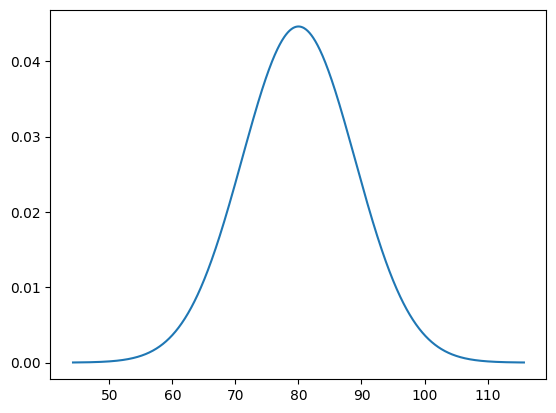

In [106]:
mu = n * lmbda
sigma = math.sqrt(n * lmbda)
x = np.linspace(mu - 4*sigma, mu + 4*sigma, 1000)
y = norm(x, mu, sigma)

plt.plot(x, y)
plt.show()

In [107]:
sum_of_random_vars = np.array([sum([gen.next_from_poisson(lmbda) for _ in range(0, n)]) for _ in range(0, num_of_samples + 1)])

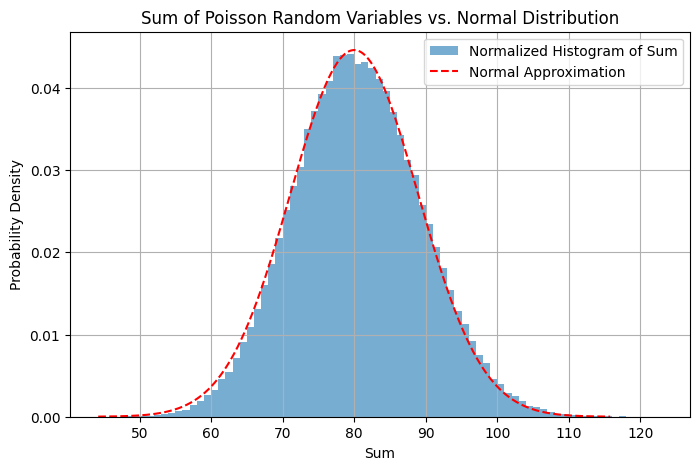

In [108]:
plt.figure(figsize=(8, 5))
plt.hist(sum_of_random_vars, bins='auto', density=True, alpha=0.6, label='Normalized Histogram of Sum')
plt.plot(x, y, 'r--', label='Normal Approximation')
plt.title("Sum of Poisson Random Variables vs. Normal Distribution")
plt.xlabel("Sum")
plt.ylabel("Probability Density")
plt.grid(True)
plt.legend()
plt.show()

In [109]:
step = 500
frames = list(range(step, len(sum_of_random_vars) + 1, step))

fig, ax = plt.subplots(figsize=(8, 5))

def update(frame):
    ax.clear()
    current_data = sum_of_random_vars[:frame]
    ax.hist(current_data, bins='auto', density=True, alpha=0.6, label=f'Samples shown: {frame}')
    ax.plot(x, y, 'r--', label='Normal Approximation')
    ax.set_title("Sum of Poisson Random Variables vs. Normal Distribution")
    ax.set_xlabel("Sum")
    ax.set_ylabel("Probability Density")
    ax.grid(True)
    ax.legend()
    ax.set_xlim(min(sum_of_random_vars), max(sum_of_random_vars))
    ax.set_ylim(0, 0.08)

plt.close()
ani = FuncAnimation(fig, update, frames=frames, repeat=False)
HTML(ani.to_jshtml())

In [111]:
num_of_samples = 10000
max_n = 50
step = 5
frames = list(range(1, max_n + 1, step))

fig, ax = plt.subplots(figsize=(8, 5))

def update(n):
    ax.clear()
    
    # Generate a sum of n Poisson variables
    sums = np.array([sum([gen.next_from_poisson(lmbda) for _ in range(0, n)]) for _ in range(0, num_of_samples + 1)])
    
    # Normal approximation
    mu = n * lmbda
    sigma = np.sqrt(n * lmbda)
    x = np.linspace(mu - 4*sigma, mu + 4*sigma, 1000)
    y = norm(x, mu, sigma)
    
    # Plot histogram and normal curve
    ax.hist(sums, bins='auto', density=True, alpha=0.6, label=f'Sum of {n} variables')
    ax.plot(x, y, 'r--', label='Normal Approximation')
    ax.set_title("CLT: Sum of Poisson Random Variables")
    ax.set_xlabel("Sum")
    ax.set_ylabel("Probability Density")
    ax.set_xlim(0, max_n * lmbda + 20)
    ax.set_ylim(0, 0.1)
    ax.grid(True)
    ax.legend()

plt.close()
ani = FuncAnimation(fig, update, frames=frames, repeat=False)
HTML(ani.to_jshtml())